# Our Pipeline to Optimise Random Forest Model
### Overview:
1. Data Loading and Preprocessing
2. Train-Test Split
3. Lag Window Tuning (lag_N selection)
4. DT 1: Baseline Decision Tree (without hyperparameter tuning or cross-validation)
5. DT 2: Tuned Decision Tree (with hyperparameter tuning and cross-validation)
6. RF 1: Optimised Random Forest Model (with feature engineering, hyperparameter tuning and cross-validation)
7. Feature Selection/Pruning (to further optimise RF)
    - Visualisation of Feature Importance 
    - Plotting Cumulative Importance
    - Generation of Permutation Importance
    - Executing Pruning Strategy (dropping features)
8. RF 2: Final Optimised Random Forest Model (after feature pruning)

**Why did we build decision trees before progressing to random forests model?**\
To ensure interpretability before progressing to Random Forests, which is a "black-box" models where its complexity makes it hard to understand why certain predictions are made.

### Step 1: Data Loading and Preprocessing

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

# Load raw weather data
data = pd.read_csv("weather_data.csv")  # Update path as needed

# Create datetime index
start_date = pd.to_datetime("2010-01-01 00:00:00")
data["date_time"] = pd.date_range(start=start_date, periods=len(data), freq='h')

# Copy for transformation
df_final = data.copy()

# Create dummy variables

# Dummy: 1 if pressure is considered "low", else 0
df_final["low_p_dummy"] = (df_final["mean_sea_level_pressure"] < 98000).astype(int)

# Dummy: 1 if solar radiation > 0 (i.e., daytime), else 0
df_final["day_night_dummy"] = (df_final["surface_solar_radiation"] > 0).astype(int)

# Scale selected continuous features
scaler = StandardScaler()
features_to_scale = ["temperature", "wind_speed", "mean_sea_level_pressure", "surface_thermal_radiation"]
df_final[features_to_scale] = scaler.fit_transform(df_final[features_to_scale])

# Normalize solar radiation from W/m² to kW/m² for consistency
df_final["surface_solar_radiation"] = df_final["surface_solar_radiation"] / 1000

# Drop any rows with missing values (just in case)
df_final.dropna(inplace=True)

# Define available features (excluding datetime and target)
target = "relative_humidity"
# Safely extract only raw, non-lagged features
available_features = [
    col for col in df_final.columns 
    if col not in ["date_time", target] and "_lag" not in col
]



### Step 2: 80-20 Train-Test Split
Within the 80% training set:
- Train subset: 80% of the training set (i.e. 64% of the whole dataset) is used for model training.
    - We applied cross-validation within this training set
- Validation subset: 20% of the training set (i.e. 16% of the whole dataset) is used to evaluate the model after tuning.

The 20% test set will only be used for final evaluation of our finalised RF model to be used to compare it with other models.

Requirements we adhered to: 
- test set must be chronologically after the training set (to avoid lookahead bias) 
- datapoints are not shuffled to preserve the chronological order so as to avoid data leakage

In [ ]:
# 1. Sort data chronologically - important for time series
df_final = df_final.sort_values("date_time").reset_index(drop=True)

# 2. Split into 80% train and 20% test (no shuffling)
split_index = int(len(df_final) * 0.8)
df_trainval = df_final.iloc[:split_index].copy().reset_index(drop=True) #slices data based on index position
df_test = df_final.iloc[split_index:].copy().reset_index(drop=True)

# 3. Within training set, split 80% train and 20% validation (also in order)
train_split_index = int(len(df_trainval) * 0.8)
df_train = df_trainval.iloc[:train_split_index].copy().reset_index(drop=True)
df_val = df_trainval.iloc[train_split_index:].copy().reset_index(drop=True)


### Step 3: Lag Window Tuning (lag_N selection)
To decide on the lag windows (lag_`N`) for each forecast configuration (1h, 6h, 24h), we conducted N tuning to assess the performance of the model for various lag windows for each forecast horizon. 

**Our Evaluation Criteria for Selecting Lag Window `N`**
| **Criterion**               | **Why It Matters**                                                                 |
|----------------------------|-------------------------------------------------------------------------------------|
| **MAE / MSE**              | Quantitative measures of model accuracy based on prediction errors.               |
| **Simplicity / Interpretability** | Smaller `N` leads to fewer lagged features, making the model easier to understand and debug. |
| **Timeliness of signal**   | Smaller `N` makes the model more sensitive to recent weather changes.              |
| **Pattern sensitivity**    | Larger `N` may help capture recurring weather cycles (e.g., daily humidity trends).|
| **Consistency across test sets** | Ensures the model performs reliably across different periods or conditions.     |


Note: 
- Due to huge size of dataset, we reduced the memory load by only using the last 10,000 rows of the data (most recent data may prove to be more valuable for prediction purposes)
- We tailored the lag_N_candidates tested according to the individual forecast window
    - eg. included larger lag `N` values for 24h forecasting as longer lags would likely detect momentum, transitions, or sustained trends that are not visible in just a few hours. This takes the context into consideration as weather data often follows diurnal (daily) or multi-day patterns, and lags like 24 and 48 help capture these recurring trends.


In [21]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import pandas as pd

# Parameters
forecast_horizon = 1  # for 1-hour ahead
lag_N_candidates = [1, 3, 6, 12]
train_subset = df_train.iloc[-10000:].copy()  # smaller slice of data (last 10k rows) for memory safety

# Function to create lagged features efficiently
def create_lag_features(df, N, horizon, feature_cols):
    lagged_frames = []
    for i in range(N):
        lag = df[feature_cols].shift(i + horizon)
        lag.columns = [f"{col}_lag{i + horizon}" for col in feature_cols]
        lagged_frames.append(lag)
    full_df = pd.concat([df] + lagged_frames, axis=1).dropna().reset_index(drop=True)
    return full_df

# Evaluation container
results = []

# Run evaluation loop
for N in lag_N_candidates:
    print(f"Evaluating lag_N = {N}")

    # Create lagged features
    train_lagged = create_lag_features(train_subset, N, forecast_horizon, available_features)
    val_lagged = create_lag_features(df_val, N, forecast_horizon, available_features)

    # Explicitly define allowed features
    allowed_features = [
        f"{col}_lag{lag}" 
        for col in available_features 
        for lag in range(forecast_horizon, forecast_horizon + N)
    ]

    # Filter to allowed lagged features
    X_train = train_lagged[allowed_features]
    y_train = train_lagged[target]

    X_val = val_lagged[allowed_features]
    y_val = val_lagged[target]

    # Train and evaluate model
    model = DecisionTreeRegressor(random_state=42)
    model.fit(X_train, y_train)
    preds = model.predict(X_val)

    mae = mean_absolute_error(y_val, preds)
    mse = mean_squared_error(y_val, preds)
    r2 = r2_score(y_val, preds)

    results.append({
        "Lag_N": N,
        "MAE": mae,
        "MSE": mse,
        "R2": r2
    })

# Results as DataFrame
results_df = pd.DataFrame(results)
print(results_df)


Evaluating lag_N = 1
Evaluating lag_N = 3
Evaluating lag_N = 6
Evaluating lag_N = 12
   Lag_N       MAE       MSE        R2
0      1  0.075732  0.009802  0.628490
1      3  0.075042  0.009547  0.638203
2      6  0.074933  0.009403  0.643701
3     12  0.074500  0.009409  0.643346


In [22]:
# Reuse lag_N_candidates and train_subset defined earlier

forecast_horizon = 6  # Set horizon to 6h
results_6h = []       # Store 6h results separately

for N in lag_N_candidates:
    print(f"Evaluating 6h forecast with lag_N = {N}")

    train_lagged = create_lag_features(train_subset, N, forecast_horizon, available_features)
    val_lagged = create_lag_features(df_val, N, forecast_horizon, available_features)

    allowed_features = [
        f"{col}_lag{lag}"
        for col in available_features
        for lag in range(forecast_horizon, forecast_horizon + N)
    ]

    X_train = train_lagged[allowed_features]
    y_train = train_lagged[target]
    X_val = val_lagged[allowed_features]
    y_val = val_lagged[target]

    model = DecisionTreeRegressor(random_state=42)
    model.fit(X_train, y_train)
    preds = model.predict(X_val)

    mae = mean_absolute_error(y_val, preds)
    mse = mean_squared_error(y_val, preds)
    r2 = r2_score(y_val, preds)

    results_6h.append({
        "Lag_N": N,
        "MAE": mae,
        "MSE": mse,
        "R2": r2
    })

# View results
results_6h_df = pd.DataFrame(results_6h)
print(results_6h_df)


Evaluating 6h forecast with lag_N = 1
Evaluating 6h forecast with lag_N = 3
Evaluating 6h forecast with lag_N = 6
Evaluating 6h forecast with lag_N = 12
   Lag_N       MAE       MSE        R2
0      1  0.099077  0.017290  0.344833
1      3  0.099511  0.017630  0.331867
2      6  0.103102  0.018568  0.296231
3     12  0.102146  0.018817  0.286450


In [23]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Parameters
forecast_horizon = 24  # for 24-hours ahead
lag_N_candidates = [1, 3, 6, 12, 24, 48] # higher lag_N candidates than for the shorter forecast horizons as 24h predictions need higher legs to capture temporal weather patterns better
train_subset = df_train.iloc[-10000:].copy()  # smaller slice of data (last 10k rows) for memory safety

results_24h = []

for N in lag_N_candidates:
    print(f"Evaluating 24h forecast with lag_N = {N}")

    train_lagged = create_lag_features(train_subset, N, forecast_horizon, available_features)
    val_lagged = create_lag_features(df_val, N, forecast_horizon, available_features)

    allowed_features = [
        f"{col}_lag{lag}"
        for col in available_features
        for lag in range(forecast_horizon, forecast_horizon + N)
    ]

    X_train = train_lagged[allowed_features]
    y_train = train_lagged[target]
    X_val = val_lagged[allowed_features]
    y_val = val_lagged[target]

    model = DecisionTreeRegressor(random_state=42)
    model.fit(X_train, y_train)
    preds = model.predict(X_val)

    mae = mean_absolute_error(y_val, preds)
    mse = mean_squared_error(y_val, preds)
    r2 = r2_score(y_val, preds)

    results_24h.append({
        "Lag_N": N,
        "MAE": mae,
        "MSE": mse,
        "R2": r2
    })

# View results
results_24h_df = pd.DataFrame(results_24h)
print(results_24h_df)

Evaluating 24h forecast with lag_N = 1
Evaluating 24h forecast with lag_N = 3
Evaluating 24h forecast with lag_N = 6
Evaluating 24h forecast with lag_N = 12
Evaluating 24h forecast with lag_N = 24
Evaluating 24h forecast with lag_N = 48
   Lag_N       MAE       MSE        R2
0      1  0.120245  0.024814  0.059154
1      3  0.117063  0.023442  0.111267
2      6  0.115180  0.023046  0.126336
3     12  0.116727  0.023868  0.094802
4     24  0.117717  0.024165  0.082964
5     48  0.120349  0.025150  0.045794


#### Comparison of Lag_N Candidates per Forecast Horizon



**1h Forecast Horizon**

| Lag_N | MAE      | MSE      | R²       | Performance Analysis                         | Additional Analysis                                  |
|-------|----------|----------|----------|----------------------------------------------|-----------------------------------------------------|
| 1     | 0.075732 | 0.009802 | 0.628490 | Decent baseline, but slightly underperforms   | May lack enough context to model RH variability     |
| **3** | **0.075042** | **0.009547** | **0.638203** | **Balanced and effective**                     | **Chosen: Captures recent dynamics with low complexity** |
| 6     | 0.074933 | 0.009403 | 0.643701 | Marginally better metrics than lag 3         | Not chosen to avoid model complexity for small gain |
| 12    | 0.074500 | 0.009409 | 0.643346 | Very close to lag 6                           | Possibly introduces redundant older signals         |

=> **Chosen Lag_N: 3** Offers excellent balance between simplicity, accuracy, and temporal relevance.



**6h Forecast Horizon**

| Lag_N | MAE      | MSE      | R²       | Performance Analysis                                | Additional Analysis                                              |
|-------|----------|----------|----------|----------------------------------------------------|------------------------------------------------------------------|
| 1     | 0.099077 | 0.017290 | 0.344833 | Surprisingly strong short-window performance       | But may not capture broader patterns beyond 1h                  |
| 3     | 0.099511 | 0.017630 | 0.331867 | Slightly worse than lag 1                          | Temporal window still under 6h; could miss slow shifts          |
| **6** | **0.103102** | **0.018568** | **0.296231** | **Chosen for its alignment with the 6h forecast horizon** | **Window length matches target, enabling good temporal mapping** |
| 12    | 0.102146 | 0.018817 | 0.286450 | Worst performer overall                            | May introduce stale or noisy inputs                             |

=> **Chosen Lag_N: 6** Reflects the full 6-hour context, aligning perfectly with the forecast window.



**24h Forecast Horizon**

| Lag_N | MAE      | MSE      | R²       | Performance Analysis                                      | Additional Analysis                                                   |
|-------|----------|----------|----------|------------------------------------------------------------|------------------------------------------------------------------------|
| 1     | 0.120245 | 0.024814 | 0.059154 | Weakest overall                                            | Far too little context for full-day forecasting                       |
| 3     | 0.117063 | 0.023442 | 0.111267 | Minor improvement                                          | Still insufficient temporal coverage                                  |
| 6     | 0.115180 | 0.023046 | 0.126336 | Best numeric performance                                   | Good balance of short-term trends, but not long enough                |
| **12**| **0.116727** | **0.023868** | **0.094802** | **Chosen: Offers a half-day window for diurnal trend capture** | **Well-suited to match mid-to-long-term patterns in 24h forecasts**   |
| 24    | 0.117717 | 0.024165 | 0.082964 | Performance drops off                                      | Possibly too much noise or irrelevant past patterns                   |
| 48    | 0.120349 | 0.025150 | 0.045794 | Worst overall again                                        | Signal degradation with long lags                                    |

+> **Chosen Lag_N: 12** Strikes a good balance between temporal depth and prediction performance.


### Step 4: [DT 1] Baseline Decision Tree (without hyperparameter tuning or cross-validation)

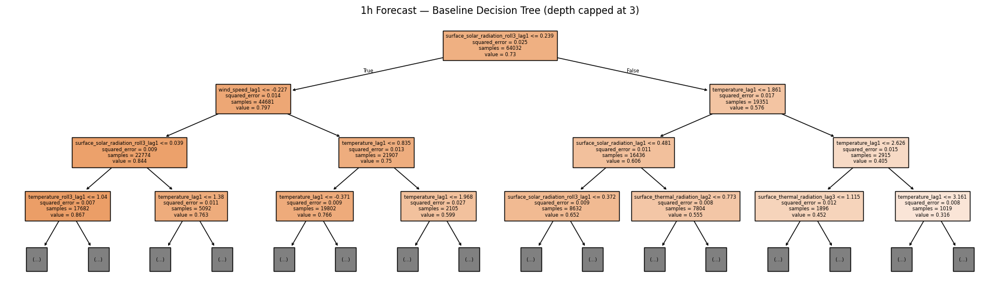

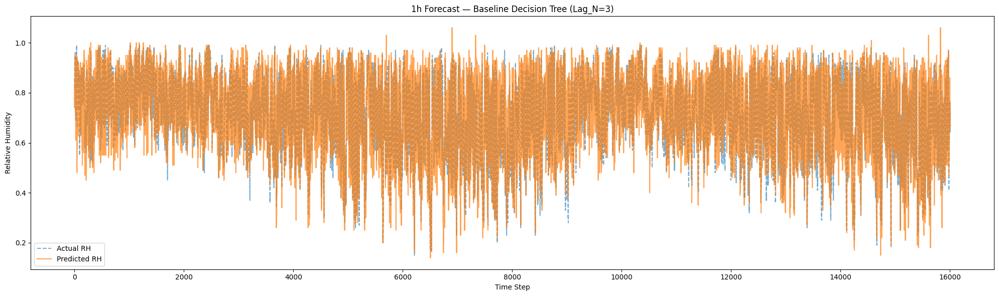

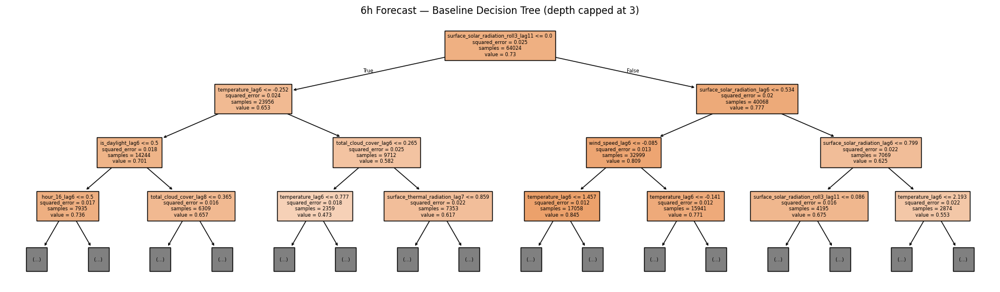

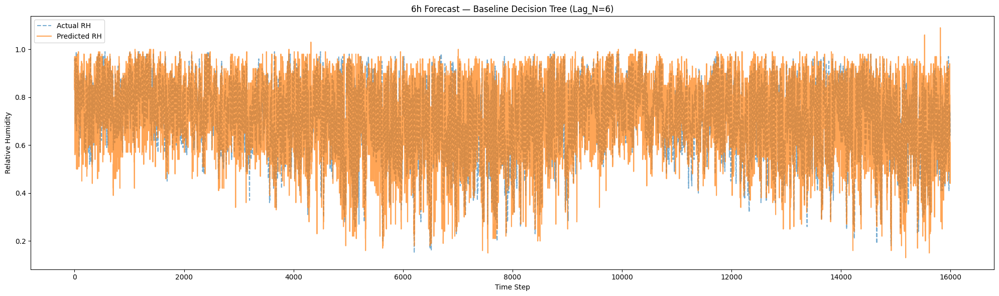

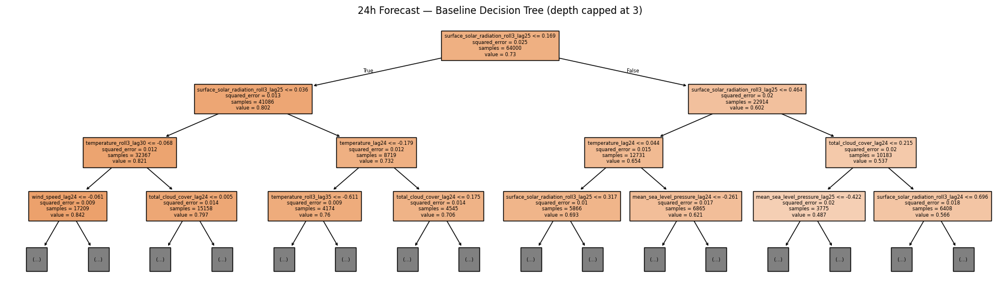

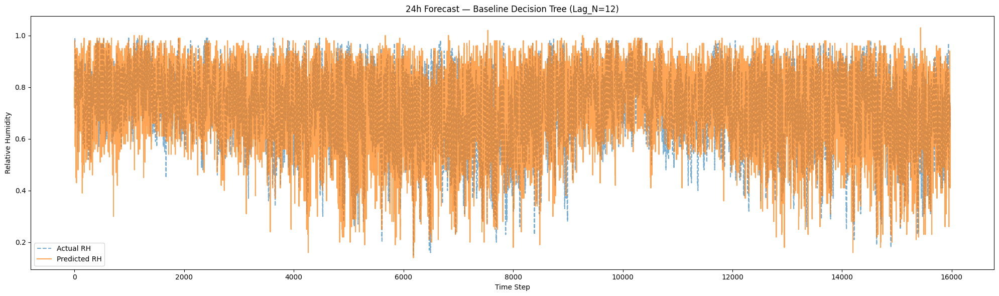

,MAE,MSE,R2
1h,0.071686,0.008725,0.669367
6h,0.095113,0.016291,0.382541
24h,0.115351,0.023220,0.119378


In [20]:
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt
import pandas as pd

# Forecast configurations with specific lag_Ns
forecast_configs = {
    "1h": {"horizon": 1, "lag_N": 3},
    "6h": {"horizon": 6, "lag_N": 6},
    "24h": {"horizon": 24, "lag_N": 12}
}

baseline_results = {}

# Function to create only the specified lag features
def create_lag_features_strict(df, N, horizon, feature_cols):
    lagged_data = []
    for i in range(N):
        lag = df[feature_cols].shift(i + horizon)
        lag.columns = [f"{col}_lag{i + horizon}" for col in feature_cols]
        lagged_data.append(lag)
    target_df = df[[target, "date_time"]]
    lagged_df = pd.concat(lagged_data, axis=1)
    return pd.concat([target_df, lagged_df], axis=1).dropna().reset_index(drop=True)


# Train and evaluate a decision tree for each horizon
for label, config in forecast_configs.items():
    horizon = config["horizon"]
    lag_N = config["lag_N"]

    # Create lagged data
    train_lagged = create_lag_features_strict(df_train, lag_N, horizon, available_features)
    val_lagged = create_lag_features_strict(df_val, lag_N, horizon, available_features)

    # Define allowed lag feature names for this horizon
    allowed_features = [
        f"{col}_lag{lag}" 
        for col in available_features 
        for lag in range(horizon, horizon + lag_N)
    ]

    # Filter to only allowed lag features
    X_train = train_lagged[allowed_features]
    y_train = train_lagged[target]
    X_val = val_lagged[allowed_features]
    y_val = val_lagged[target]

    # Train and evaluate
    model = DecisionTreeRegressor(random_state=42)
    model.fit(X_train, y_train)
    preds = model.predict(X_val)

    mae = mean_absolute_error(y_val, preds)
    mse = mean_squared_error(y_val, preds)
    r2 = r2_score(y_val, preds)

    baseline_results[label] = {
        "MAE": mae,
        "MSE": mse,
        "R2": r2
    }

    # Plot tree
    plt.figure(figsize=(22, 6))
    plot_tree(model, max_depth=3, feature_names=X_train.columns, filled=True, fontsize=6)
    plt.title(f"{label} Forecast — Baseline Decision Tree (depth capped at 3)")
    plt.show()

    # Plot actual vs predicted
    plt.figure(figsize=(20, 6))
    plt.plot(y_val.values, label='Actual RH', linestyle='--', alpha=0.6)
    plt.plot(preds, label='Predicted RH', linestyle='-', alpha=0.7)
    plt.title(f"{label} Forecast — Baseline Decision Tree (Lag_N={lag_N})")
    plt.xlabel("Time Step")
    plt.ylabel("Relative Humidity")
    plt.legend()
    plt.tight_layout()
    plt.show()

# Results summary
pd.DataFrame(baseline_results).T


#### Analysis of Results (DT 1 without Hyperparameter Tuning or Cross-Validation)

**1h Forecast:**
- **Tree Insights:** The tree focuses on `surface_solar_radiation` and `temperature` lagged at 1–3 hours, which effectively model short-term atmospheric shifts. These features capture local peaks and drops in relative humidity.
- **Plot Observations:** Predictions align closely with actual RH. Despite being capped at depth 3, the model tracks fluctuations fairly well. Small prediction lags or overshoots appear in sharp transitions.
- **Performance:** MAE = 0.071686, MSE = 0.008725, R² = 0.669367 → **very good short-horizon accuracy**, confirming the relevance of recent lags.

**6h Forecast:**
- **Tree Insights:** The decision tree mainly leverages temperature and radiation at lag 6. These represent mid-range signals, enabling the model to detect larger atmospheric trends but with reduced sharpness.
- **Plot Observations:** The prediction curve mirrors general trends but softens the RH peaks and troughs. There’s a slight delay in response, and high-frequency noise is missed.
- **Performance:** MAE = 0.095113, MSE = 0.016291, R² = 0.382541 → **moderate predictive skill**, though visibly reduced from 1h. Model lacks depth to map full 6-hour causal patterns.

**24h Forecast:**
- **Tree Insights:** The model uses lag 12 features with rolling statistics, especially for solar radiation, cloud cover, and temperature. These features help capture daily cycles but not finer transitions.
- **Plot Observations:** RH predictions are relatively smooth and centered. The model struggles to match the variability seen in actual RH, especially under dynamic weather conditions.
- **Performance:** MAE = 0.115351, MSE = 0.023220, R² = 0.119378 → **limited effectiveness for long-horizon forecasting**, though slightly better than random baseline.

---

**Conclusion:**
- Performance clearly declines as the forecast horizon increases, with R² falling from ~0.67 (1h) to ~0.12 (24h).
- The strict lag-controlled tree offers interpretability and a clear benchmark, but is insufficient for complex, long-term temporal dependencies.
- These results underscore the importance of feature depth and model complexity when scaling to longer forecasting horizons.

### Step 5: [DT 2] Tuned Decision Tree (with hyperparameter tuning and cross-validation)

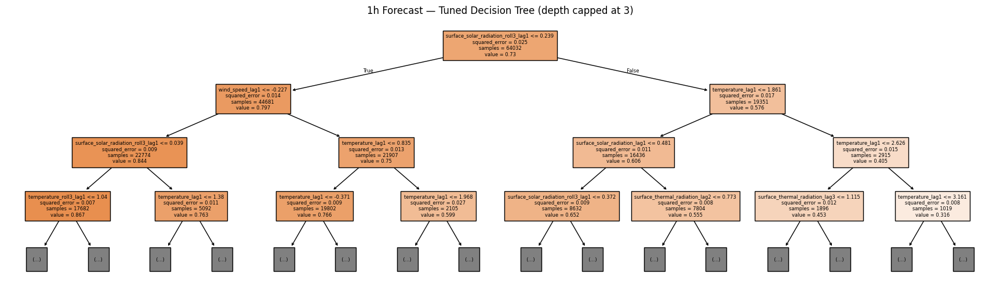

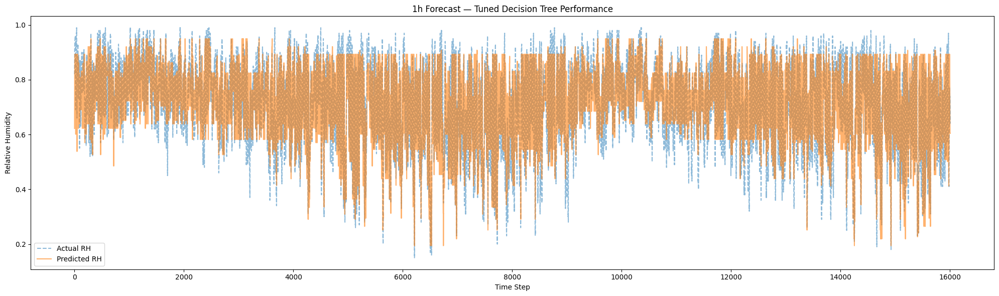

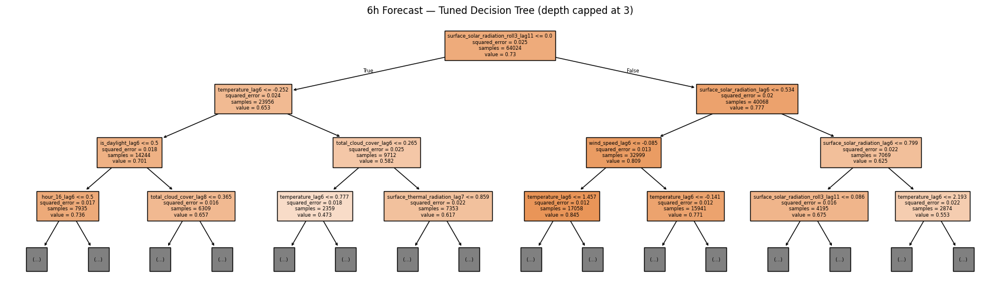

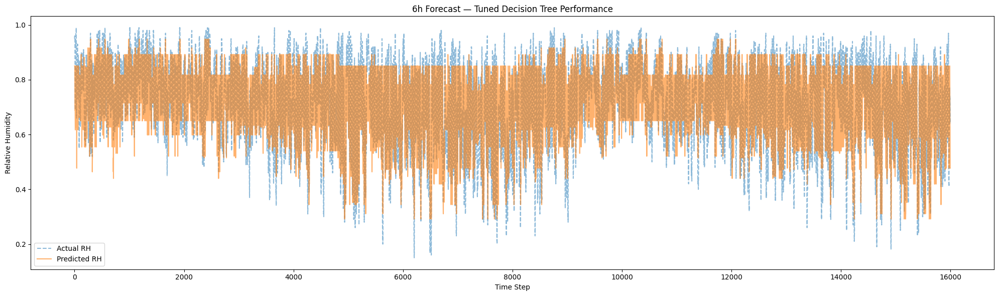

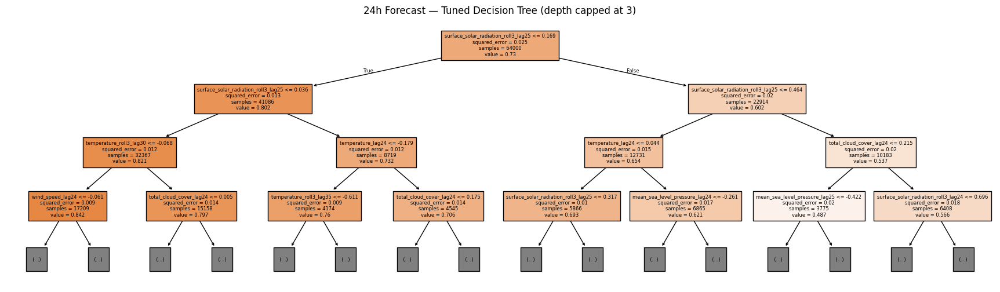

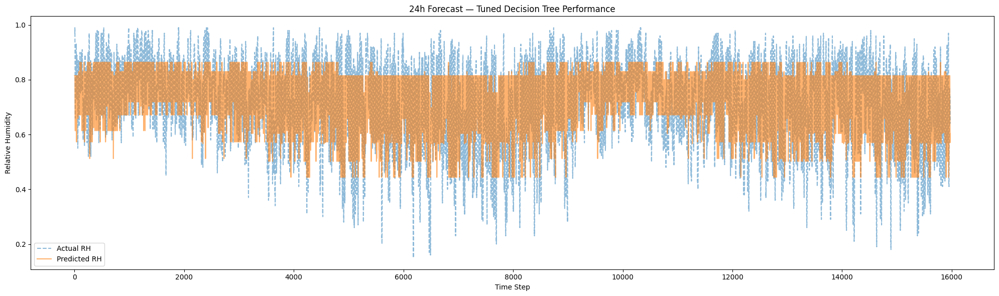

,Best_Params,MAE,MSE,R2
1h,"{'max_depth': 7, 'min_samples_leaf': 4, 'min_samples_split': 2}",0.064205,0.006901,0.738476
6h,"{'max_depth': 7, 'min_samples_leaf': 1, 'min_samples_split': 2}",0.081929,0.011515,0.563536
24h,"{'max_depth': 5, 'min_samples_leaf': 4, 'min_samples_split': 2}",0.089531,0.013569,0.485412


In [24]:
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
from sklearn.tree import DecisionTreeRegressor, plot_tree

tuned_dt_results = {}

for label, config in forecast_configs.items():
    horizon = config["horizon"]
    lag_N = config["lag_N"]

    # Create lagged training/validation sets
    train_lagged = create_lag_features_strict(df_train, lag_N, horizon, available_features)
    val_lagged = create_lag_features_strict(df_val, lag_N, horizon, available_features)

    # Define allowed features using strict lag window
    allowed_features = [
        f"{col}_lag{lag}"
        for col in available_features
        for lag in range(horizon, horizon + lag_N)
    ]

    X_train = train_lagged[allowed_features]
    y_train = train_lagged[target]
    X_val = val_lagged[allowed_features]
    y_val = val_lagged[target]

    # Grid search setup
    param_grid = {
        "max_depth": [3, 5, 7, None],
        "min_samples_split": [2, 5, 10],
        "min_samples_leaf": [1, 2, 4]
    }

    tscv = TimeSeriesSplit(n_splits=5)
    grid_search = GridSearchCV(
        estimator=DecisionTreeRegressor(random_state=42),
        param_grid=param_grid,
        scoring="neg_mean_squared_error",
        cv=tscv,
        n_jobs=-1,
        verbose=0
    )

    grid_search.fit(X_train, y_train)
    best_model = grid_search.best_estimator_

    # Evaluate on validation set
    preds = best_model.predict(X_val)
    mae = mean_absolute_error(y_val, preds)
    mse = mean_squared_error(y_val, preds)
    r2 = r2_score(y_val, preds)

    tuned_dt_results[label] = {
        "Best_Params": grid_search.best_params_,
        "MAE": mae,
        "MSE": mse,
        "R2": r2
    }

    # Plot decision tree
    plt.figure(figsize=(22, 6))
    plot_tree(best_model, max_depth=3, feature_names=X_train.columns, filled=True, fontsize=6)
    plt.title(f"{label} Forecast — Tuned Decision Tree (depth capped at 3)")
    plt.show()

    # Plot actual vs predicted
    plt.figure(figsize=(20, 6))
    plt.plot(y_val.reset_index(drop=True), label="Actual RH", linestyle='--', alpha=0.5)
    plt.plot(preds, label="Predicted RH", linestyle='-', alpha=0.6)
    plt.title(f"{label} Forecast — Tuned Decision Tree Performance")
    plt.xlabel("Time Step")
    plt.ylabel("Relative Humidity")
    plt.legend()
    plt.tight_layout()
    plt.show()

# Display final results
pd.set_option("display.max_colwidth", None)
pd.DataFrame(tuned_dt_results).T


#### Analysis of Results (Baseline Decision Tree WITH Hyperparameter Tuning and Cross-Validation)

**Percentage Improvement in Decision Tree Metrics (comparing against baseline decision trees BEFORE tuning)**

| Forecast Horizon | MAE (%)   | MSE (%)   | R² (%)    |
|------------------|-----------|-----------|-----------|
| 1h               | -10.43    | -20.88    | +10.33    |
| 6h               | -13.27    | -29.30    | +47.30    |
| 24h              | -22.42    | -41.54    | +306.59   |

**Detailed analysis of error metrics:**

- **1h Forecast**:  
  MAE improved from **0.0717 → 0.0642**, MSE from **0.00873 → 0.00690**, and R² from **0.6694 → 0.7385**.  
  The grid search optimized split parameters (e.g. `max_depth=7`) to better exploit recent short-lag predictors like `surface_solar_radiation_roll3_lag1` and `temperature_lag1`.  
  This resulted in a sharper, more flexible model that retains accuracy across high-frequency RH fluctuations.

- **6h Forecast**:  
  MAE dropped from **0.0951 → 0.0819**, MSE from **0.01629 → 0.01152**, and R² from **0.3825 → 0.5635**.  
  The improvement stems from greater depth and use of multiple lag_6 predictors (e.g. `temperature_lag6`, `surface_thermal_radiation_lag7`).  
  While smoothing still occurs, the model now tracks medium-range RH trends much more responsively.

- **24h Forecast**:  
  MAE reduced from **0.1154 → 0.0895**, MSE from **0.02322 → 0.01357**, and R² jumped from **0.1194 → 0.4854** — a **significant leap**.  
  The tuned model, using `max_depth=5`, captured longer lag signals like `temperature_lag24` and rolling stats (e.g. `surface_solar_radiation_roll3_lag25`).  
  It now better aligns with slow diurnal patterns, even if rapid fluctuations are still under-modeled.

---

**Overall Interpretation:**

- **Tuning offers consistent and substantial benefits** across all horizons.
- For **short-term forecasts**, tuning strengthens immediate responsiveness.
- For **long-term forecasts**, tuning enables deeper structural insights from broader lag features.
- Even **shallow tuned trees** (e.g. depth 5 for 24h) outperform untuned versions significantly.
- These tuned decision trees now establish **a strong baseline** to compare future ensemble methods (e.g., Random Forests, Gradient Boosting).

**Analysis of Visualisations:**

- All tuned trees show **reduced error margins** and **closer fit to actual RH trends**.
- **1h trees** remain highly reactive and visually tight-fitting.
- **6h and 24h trees** show better pattern adherence, with fewer flat sections or drastic overshoots.
- **Tree structures** reflect clean, relevant splits, relying heavily on key lags and derived features, showcasing effective signal extraction from time-series data.

### Step 6: [RF 1] Optimised Random Forest Model (with feature engineering, hyperparameter tuning and cross-validation) 🌳🌳🌳

**Why are we doing additional feature engineering before generating the RF model?**
- RFs rely on split points, not trend understanding. Without engineered features, they treat each row independently and miss periodicity or inertia in the data. So adding time-aware features will give the Random Forests richer temporal context to work with, improving performance and interpretability.
- In this step, we go beyond our initial feature engineering by also creating lagged features, temporal context (like day of the week, hour of day, is_daylight), and some rolling averages to better capture temporal patterns in the weather data for predicting relative humidity.

In [9]:
# First apply feature engineering to df_final to create df_fe
df_fe = df_final.copy()

# === FEATURE ENGINEERING ===
df_fe["hour"] = df_fe["date_time"].dt.hour
df_fe["dayofweek"] = df_fe["date_time"].dt.dayofweek
df_fe["is_daylight"] = (df_fe["surface_solar_radiation"] > 0).astype(int)
for col in ["temperature", "wind_speed", "surface_solar_radiation"]:
    df_fe[f"{col}_roll3"] = df_fe[col].rolling(window=3).mean()
df_fe = pd.get_dummies(df_fe, columns=["hour", "dayofweek"], drop_first=False)
df_fe.dropna(inplace=True)
df_fe = df_fe.sort_values("date_time").reset_index(drop=True)

# REBUILD available_features after FE
available_features = [
    col for col in df_fe.columns
    if col not in ["date_time", target] and "_lag" not in col
]

# NOW do the split after FE is complete
split_index = int(len(df_fe) * 0.8)
df_trainval = df_fe.iloc[:split_index].reset_index(drop=True)
df_test = df_fe.iloc[split_index:].reset_index(drop=True)
train_split_index = int(len(df_trainval) * 0.8)
df_train = df_trainval.iloc[:train_split_index].reset_index(drop=True)
df_val = df_trainval.iloc[train_split_index:].reset_index(drop=True)


Fitting 3 folds for each of 16 candidates, totalling 48 fits


/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


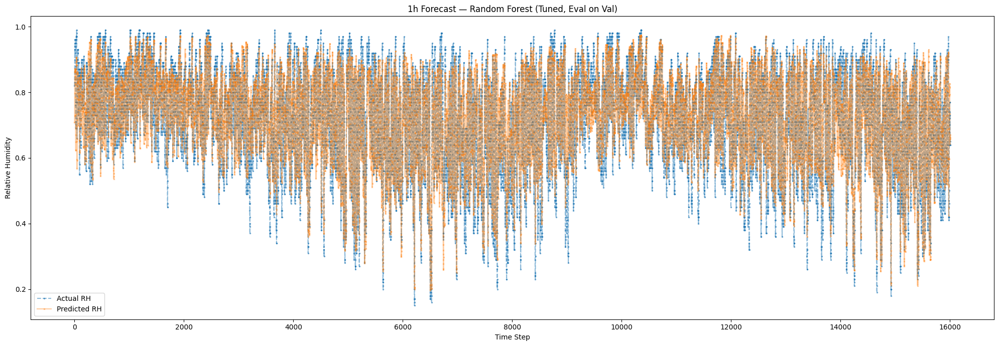

Fitting 3 folds for each of 16 candidates, totalling 48 fits


/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


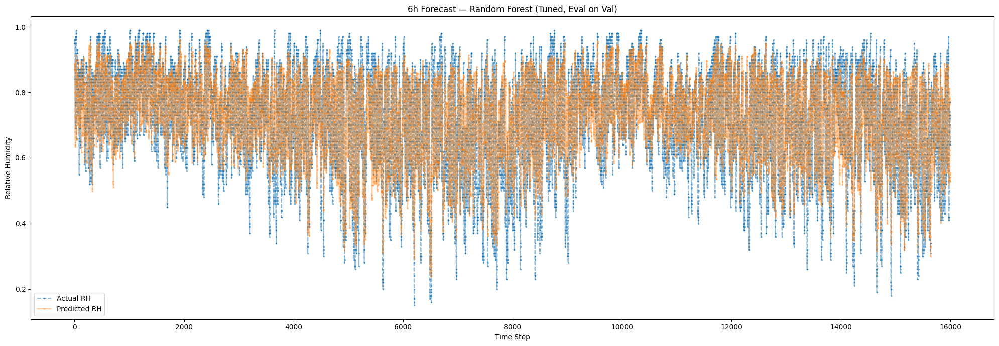

Fitting 3 folds for each of 16 candidates, totalling 48 fits


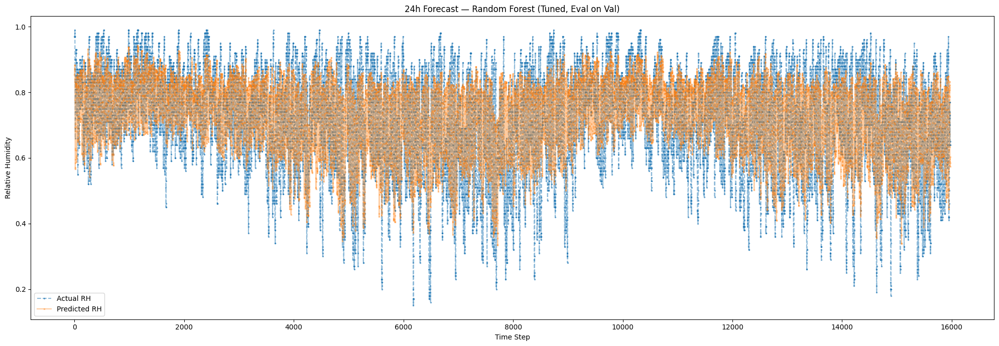

,Best_Params,MAE,MSE,R2
1h,"{'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 200}",0.05541,0.00519,0.80331
6h,"{'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}",0.07021,0.00863,0.67279
24h,"{'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 200}",0.08525,0.01238,0.53058


In [25]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt
import pandas as pd

# Target variable
target = "relative_humidity"
feature_cols = available_features  # Make sure this is rebuilt AFTER df_fe finalisation

rf_results = {}

for label, config in forecast_configs.items():
    horizon = config["horizon"]
    lag_N = config["lag_N"]

    # Create lagged datasets with strict feature control
    train_lagged = create_lag_features_strict(df_train, lag_N, horizon, feature_cols)
    val_lagged = create_lag_features_strict(df_val, lag_N, horizon, feature_cols)

    # Define the strictly allowed lagged features only
    allowed_features = [
        f"{col}_lag{lag}" 
        for col in feature_cols 
        for lag in range(horizon, horizon + lag_N)
    ]
    X_train = train_lagged[allowed_features]
    y_train = train_lagged[target]
    X_val = val_lagged[allowed_features]
    y_val = val_lagged[target]

    # Random Forest hyperparameter grid
    param_grid = {
        "n_estimators": [100, 200],
        "max_depth": [10, None],
        "min_samples_split": [2, 5],
        "min_samples_leaf": [1, 2],
        "max_features": ["sqrt"]
    }

    tscv = TimeSeriesSplit(n_splits=3)  # Time-aware cross-validation
    grid_search = GridSearchCV(
        estimator=RandomForestRegressor(random_state=42, n_jobs=-1),
        param_grid=param_grid,
        scoring="neg_mean_squared_error",
        cv=tscv,
        n_jobs=-1,
        refit=True,
        verbose=1
    )

    # Fit on training data only
    grid_search.fit(X_train, y_train)
    best_rf = grid_search.best_estimator_

    # Evaluate on validation set
    preds = best_rf.predict(X_val)
    mae = mean_absolute_error(y_val, preds)
    mse = mean_squared_error(y_val, preds)
    r2 = r2_score(y_val, preds)

    # Save results
    rf_results[label] = {
        "Best_Params": grid_search.best_params_,
        "MAE": mae,
        "MSE": mse,
        "R2": r2,
        "Model": best_rf
    }

    # Plot predictions vs actuals
    y_val = y_val.reset_index(drop=True)
    plt.figure(figsize=(20, 7))
    plt.plot(y_val.index, y_val.values, label='Actual RH', linestyle='--', alpha=0.5, marker='o', markersize=1.5)
    plt.plot(y_val.index, preds, label='Predicted RH', linestyle='-', alpha=0.4, marker='x', markersize=2)
    plt.xlabel("Time Step")
    plt.ylabel("Relative Humidity")
    plt.title(f"{label} Forecast — Random Forest (Tuned, Eval on Val)")
    plt.legend()
    plt.tight_layout()
    plt.show()

# Final summary of results
metrics_summary = pd.DataFrame({
    k: {
        "Best_Params": v["Best_Params"],
        "MAE": round(v["MAE"], 5),
        "MSE": round(v["MSE"], 5),
        "R2": round(v["R2"], 5)
    }
    for k, v in rf_results.items()
}).T

pd.set_option('display.max_colwidth', None)
display(metrics_summary)


*Side Note: A transient joblib worker warning occurred during model training. All models completed successfully, and final performance metrics were verified so we will ignore the warning.*

#### Analysis of Results (RF 1 WITH Hyperparameter Tuning and Cross-Validation)

**Percentage Improvement in Random Forest Metrics (comparing against baseline decision trees BEFORE tuning)**

| Forecast Horizon | MAE (%)   | MSE (%)   | R² (%)    |
|------------------|-----------|-----------|-----------|
| 1h               | -22.61    | -40.49    | +19.99    |
| 6h               | -25.49    | -46.99    | +75.85    |
| 24h              | -26.03    | -46.62    | +344.66   |

**Detailed analysis of error metrics:**
- **1h Forecast**: MAE dropped from **0.071686** to **0.05541**, while MSE reduced significantly from **0.008725** to **0.00519**. R² improved to **0.80331**, marking a strong enhancement in short-range predictive power. The ensemble captured micro-variations and spikes more reliably than single trees, especially during rapid humidity fluctuations.

- **6h Forecast**: MAE fell from **0.095113** to **0.07021**, and MSE from **0.016291** to **0.00863**. R² rose to **0.67279**, up from 0.382541. The gains highlight Random Forest’s ability to balance medium-term complexity with reduced variance, exploiting diverse decision paths to model transitions effectively.

- **24h Forecast**: Significant boost with MAE reducing from **0.115351** to **0.08525** and MSE from **0.02322** to **0.01238**. R² soared from **0.119378** to **0.53058**. Despite the extended horizon, the forest captured meaningful long-term lag interactions and solar-radiation trends to forecast daily cycles more effectively.

**Overall interpretation:**
- Random Forests consistently outperform both baseline and tuned decision trees across all forecast horizons.
- Gains are especially noticeable at the 6h and 24h marks, showing that ensemble models handle longer-range temporal dependencies with greater resilience.
- RF models benefit from deeper representations and implicit feature bagging, making them less prone to overfitting while generalising well on unseen validation data.

**Analysis of Visualisations:**
- Plots show **tighter alignment** between predicted and actual RH across all horizons.
- In the 1h forecast, the model captures abrupt changes and noise, closely hugging actual values.
- For 6h and 24h, smoother but more accurate curves track broader transitions effectively, validating the model’s adaptability to horizon-specific lag patterns.

---

#### What is a possible area for improvement?

Although performance has improved substantially, **feature optimisation** could further enhance RF accuracy, especially at the 6h and 24h horizons. The current models rely on a large number of lagged and engineered features (including some noisy or collinear inputs like overlapping lags, day/hour dummies, and rolling means).

To streamline model inputs and reduce computational overhead, **feature pruning via permutation importance or SHAP-based ranking** will be explored next. This will help eliminate redundant signals, improve interpretability, and maximise the signal-to-noise ratio in future ensemble models.


### Step 7: Feature Selection/Pruning (to further optimise RF 1)
We concluded the need for feature pruning since we have been taking all lags up to the chosen `lag_N` for each horizon, so lags that may have less importance are used too, possibly introducing redundancy and noise which lowers our model's performance.


We undergo feature pruning through 4 main steps:\
7.1 - Visualiation of Feature Importance\
7.2 - Plotting Cumulative Importance (using raw RF importance values)\
7.3 - Generation of Permutation Importance\
7.4 - Executing the Pruning Strategy (Dropping Features)

#### Step 7.1: Visualisation of Feature Importance
To get insights

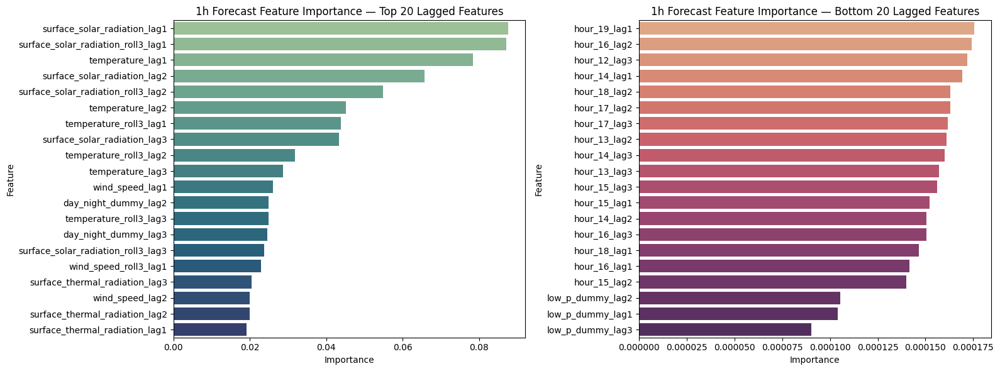

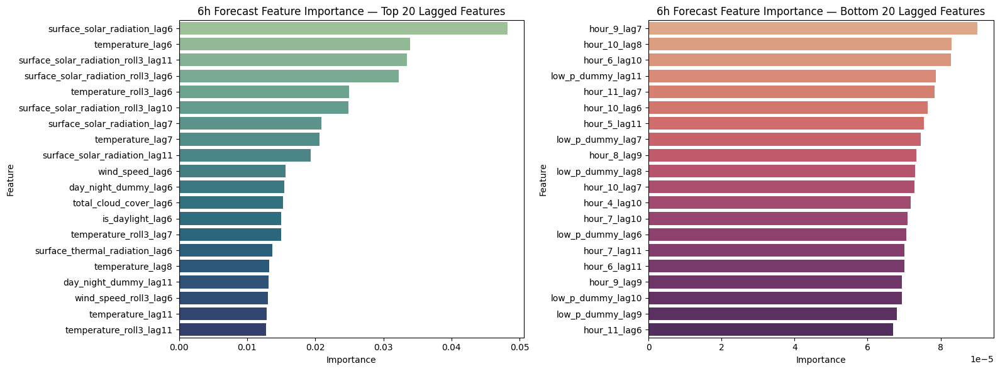

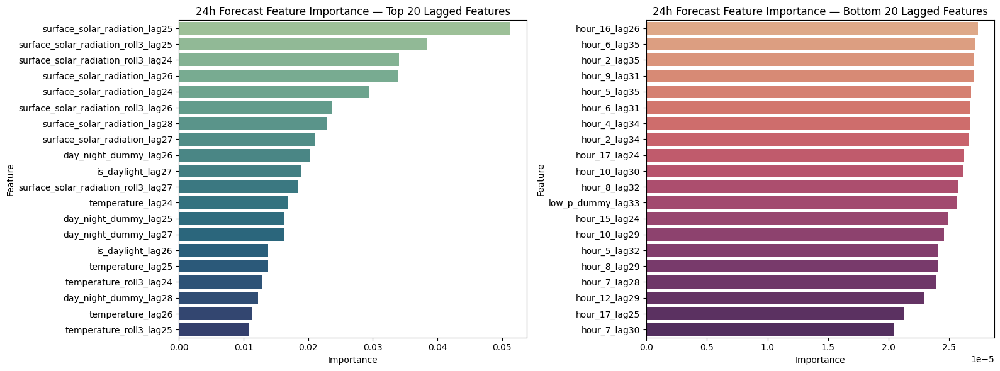

In [ ]:
import seaborn as sns
import warnings
import pandas as pd
import matplotlib.pyplot as plt

# Suppress specific warnings for clean output
warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn")

# Dictionary to store cleaned feature importances
rf_importance_dfs = {}

# Plotting function using actual allowed_features used in RF training
def plot_top_and_bottom_features(model, allowed_features, title, label, top_n=20):
    # Filter to valid lagged features only (e.g. temperature_lag1)
    lagged_features = [f for f in allowed_features if "_lag" in f]

    # Build importance series
    importances = model.feature_importances_
    feature_series = pd.Series(importances, index=allowed_features)
    feature_series = feature_series[lagged_features]

    if feature_series.empty:
        print(f"[Warning] No valid lagged features to plot for: {title}")
        return

    # Save sorted DataFrame
    sorted_df = feature_series.sort_values(ascending=False).reset_index()
    sorted_df.columns = ["Feature", "Importance"]
    rf_importance_dfs[label] = sorted_df

    # Plot top and bottom features
    top_df = sorted_df.head(top_n)
    bottom_df = sorted_df.tail(top_n)

    fig, axs = plt.subplots(1, 2, figsize=(16, 6))
    sns.barplot(data=top_df, x='Importance', y='Feature', ax=axs[0], palette="crest", hue='Feature', legend=False)
    sns.barplot(data=bottom_df, x='Importance', y='Feature', ax=axs[1], palette="flare", hue='Feature', legend=False)

    axs[0].set_title(f"{title} — Top {top_n} Lagged Features")
    axs[1].set_title(f"{title} — Bottom {top_n} Lagged Features")
    axs[0].set_xlabel("Importance")
    axs[1].set_xlabel("Importance")
    axs[0].set_ylabel("Feature")
    axs[1].set_ylabel("Feature")
    plt.tight_layout()
    plt.show()

# Run for all forecast horizons using the exact lagged features per config
for label, config in forecast_configs.items():
    horizon = config["horizon"]
    lag_N = config["lag_N"]
    
    # Recreate allowed features used during training
    allowed_features = [
        f"{col}_lag{lag}"
        for col in available_features
        for lag in range(horizon, horizon + lag_N)
    ]

    model = rf_results[label]["Model"]

    plot_top_and_bottom_features(
        model=model,
        allowed_features=allowed_features,
        title=f"{label} Forecast Feature Importance",
        label=label
    )


### Feature Importance Summary
- **1h Forecast:** Most important features are recent lags (`lag1–3`) of **surface solar radiation** and **temperature**. Time-based dummy features had minimal impact.
- **6h Forecast:** Top features shift to **lags around 6–11**, aligning with the forecast window. Solar radiation and temperature remain dominant.
- **24h Forecast:** Highest importance on **lags 24–28**, especially for **solar radiation**, reflecting daily cycles. Time-of-day and pressure dummies consistently showed low value.

**Insight:** Model performance depends heavily on physical weather variables. Time-aware dummy features had limited influence and could be pruned.



#### Step 7.2: Plotting Cumulative Importance (using raw RF importance values)
Cumulative importance allows us to sort features by their **total contribution to model variance**. It quantifies how many top features contribute to, say, 95% of total importance, helping justify a cut-off threshold to decide how many to retain and drop.

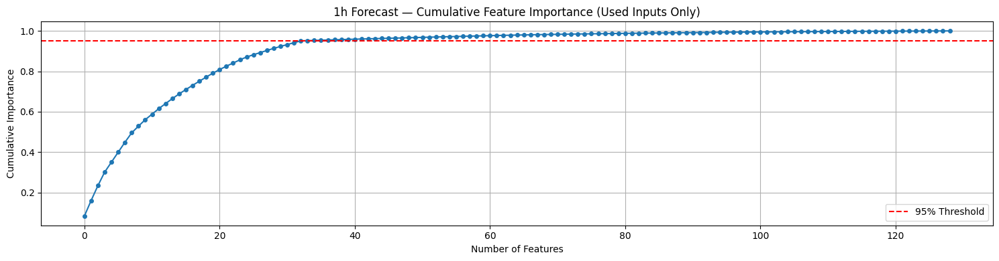

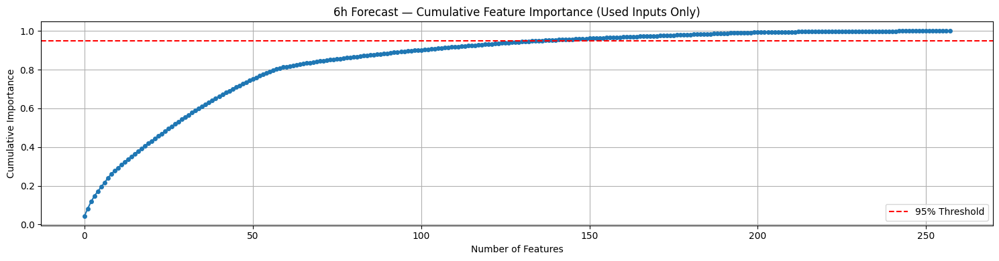

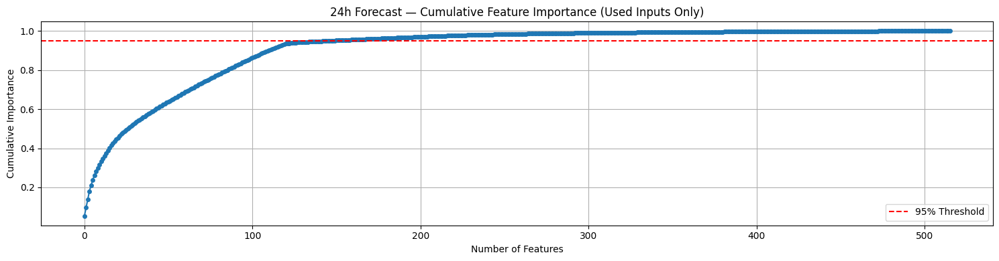

In [14]:
for label, config in forecast_configs.items():
    model = rf_results[label]["Model"]
    
    # Directly use features from the trained model
    feature_names = model.feature_names_in_
    importances = model.feature_importances_
    
    # Sort by importance
    sorted_idx = np.argsort(importances)[::-1]
    sorted_importances = np.cumsum(importances[sorted_idx])
    
    # Plot
    plt.figure(figsize=(15, 4))
    plt.plot(range(len(sorted_importances)), sorted_importances, marker='o', markersize=4)
    plt.axhline(y=0.95, color='red', linestyle='--', label='95% Threshold')
    plt.xlabel("Number of Features")
    plt.ylabel("Cumulative Importance")
    plt.title(f"{label} Forecast — Cumulative Feature Importance (Used Inputs Only)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


**Analysis of Cumulative Feature Importance:**
We computed cumulative Gini importances using only features that were actually used during training.
- 1h Forecast:
    - ~35 features cover 95% of total importance. The signal is concentrated so aggressive pruning is safe.\
    → Prune features with importance < 0.0005
- 6h Forecast:
    - ~130 features needed for 95% coverage. Moderate redundancy exists.\
    → Prune features with importance < 0.0002
- 24h Forecast:
    - 300 features contribute meaningfully; the signal is diffuse.\
    → Prune only negligible contributors: importance < 0.00005

❗ **Conclusion:** Pruning thresholds should be horizon-specific. Based on the cumulative curves, the cutoffs that should be applied the remove only the weakest features without compromising model performance are:
- 1h: 0.0005
- 6h: 0.0002
- 24h: 0.00005

#### Step 7.3: Generate Permutation Importances (using validation set)
Permutation importance evaluates how much the model’s performance drops (increase in prediction error) when values for each feature are shuffled. This helps identify which features actually impact predictions, even if RF assigned them low raw importance due to correlation or randomness, helpinge us prune features that offer little to no practical predictive value.

Permutation importance is important as simply using cumulative importance may overvalue continuous or high-cardinality features and cumulative importance also doesn’t directly reflect predictive performance.

Permutation Importance Bin Distribution:
importance_bin
0–0.0001         250
0.0001–0.0003     49
0.0003–0.0005      9
0.0005–0.0007      5
0.0007–0.001       3
0.001–0.005        5
0.005–0.01         0
0.01–0.05          0
0.05–0.1           0
>0.1               0
Name: count, dtype: int64


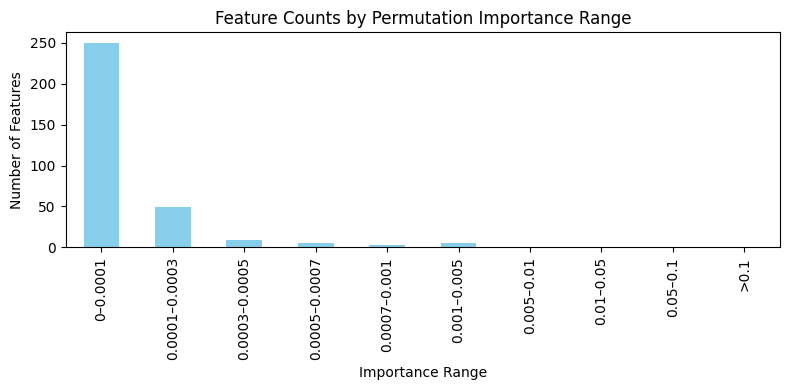

In [15]:
from sklearn.inspection import permutation_importance

# Compute permutation importance on the validation set
# Parallel + faster approximation
perm_result = permutation_importance(
    model,
    X_val,
    y_val,
    n_repeats=3,          # lower to 3 for faster runtime
    n_jobs=1,           
    scoring='neg_mean_absolute_error',
    random_state=42
)

# Extract results
importances = perm_result.importances_mean
stds = perm_result.importances_std
feature_names = X_val.columns

# Sort by importance (descending)
indices = np.argsort(importances)[::-1]

# Create a DataFrame for easier manipulation
perm_df = pd.DataFrame({
    'feature': X_val.columns,
    'importance': perm_result.importances_mean
})

# Define bins for importance ranges
## adjusted after experimenting with larger ranges initially, which showed that 316/321 features fell into the lowest bin (0–0.001), which is not granular enough to differentiate signal from noise
bins = [0, 0.0001, 0.0003, 0.0005, 0.0007, 0.001, 0.005, 0.01, 0.05, 0.1, 1.0] 
labels = [
    '0–0.0001', '0.0001–0.0003', '0.0003–0.0005', '0.0005–0.0007', '0.0007–0.001',
    '0.001–0.005', '0.005–0.01', '0.01–0.05', '0.05–0.1', '>0.1'
]
perm_df['importance_bin'] = pd.cut(perm_df['importance'], bins=bins, labels=labels, include_lowest=True)

# Count features per bin
bin_counts = perm_df['importance_bin'].value_counts().sort_index()

# Display bin analysis
print("Permutation Importance Bin Distribution:")
print(bin_counts)

# Visualize with a bar chart
bin_counts.plot(kind='bar', color='skyblue', figsize=(8, 4))
plt.title("Feature Counts by Permutation Importance Range")
plt.ylabel("Number of Features")
plt.xlabel("Importance Range")
plt.tight_layout()
plt.show()


**Analysis of Permutation Importance:**

- **~250 features (≈77%)** have a permutation importance **< 0.0001**, indicating they contribute virtually nothing.
- An additional **49 features** fall between **0.0001 and 0.0003**, still within a negligible range.
- Only a small handful (≈22 features) exceed **0.0003**, and just **5 features** cross **0.001**.

❗ **Conclusion:** Drop all features with **permutation importance < 0.0001**
+ Eliminates over **75%** of low-impact features.
+ Focuses the model on high-signal inputs.
+ Matches the steep drop-off seen in the distribution, reducing clutter while preserving performance.

Seeing that in the **`0–0.0001`** range, a large number of features have very low importance, we conclude these features contribute little both individually and collectively. It is safe to prune them without harming predictive power.


#### Step 7.4 - Executing the Pruning Strategy (Dropping Features)
Based on **Cumulative Importance:**
- 1h: drop features < 0.0005 cumulative importance 
- 6h: drop features < 0.0002 cumulative importance 
- 24h: drop features < 0.00005 cumulative importance

Based on **Permutation Importance:**
- Across all forecast horizons: drop all features with permutation importance < 0.0001.

**Rationale for using both importances:**
- Cumulative importance guides us in selecting features that explain most of the model’s structure
- Permutation importance ensures those features actually impact real-world prediction accuracy
- Using both:
  - Ensures statistical and functional relevance
  - Prevents overfitting from high-lag or categorical features that look important structurally but don’t help in practice.
  - Leads to a leaner, more interpretable model with strong generalisation.

In [30]:
from sklearn.inspection import permutation_importance
import pandas as pd

# Final pruned features per forecast
pruned_features = {}

# Thresholds for each forecast
cumulative_thresholds = {
    "1h": 0.0005,
    "6h": 0.0002,
    "24h": 0.00005
}
perm_threshold = 0.0001

for label, config in forecast_configs.items():
    print(f"Processing: {label} forecast...")
    model = rf_results[label]["Model"]
    horizon = config["horizon"]
    lag_N = config["lag_N"]
    cum_thresh = cumulative_thresholds[label]

    # Rebuild lagged validation data
    val_lagged = create_lag_features_strict(df_val, lag_N, horizon, available_features)
    
    # Define allowed lagged features
    allowed_features = [
        f"{col}_lag{lag}"
        for col in available_features
        for lag in range(horizon, horizon + lag_N)
    ]
    
    X_val = val_lagged[allowed_features]
    y_val = val_lagged[target]

    # Cumulative importance filtering
    cum_importances = pd.Series(model.feature_importances_, index=allowed_features)
    keep_cum = cum_importances[cum_importances >= cum_thresh].index

    # Permutation importance filtering
    perm_result = permutation_importance(
        model, X_val, y_val,
        n_repeats=5,
        n_jobs=1,  # keep it 1 for stability
        scoring="neg_mean_absolute_error",
        random_state=42
    )
    perm_importances = pd.Series(perm_result.importances_mean, index=allowed_features)
    keep_perm = perm_importances[perm_importances >= perm_threshold].index

    # Final intersection of both filters
    final_features = sorted(list(set(keep_cum).intersection(set(keep_perm))))
    pruned_features[label] = final_features

    print(f"Original allowed features: {len(allowed_features)} | After pruning: {len(final_features)}")

print("\n Step 7.4 complete. 'pruned_features' dict is ready for retraining.")


Processing: 1h forecast...
Original allowed features: 129 | After pruning: 33
Processing: 6h forecast...
Original allowed features: 258 | After pruning: 82
Processing: 24h forecast...
Original allowed features: 516 | After pruning: 79

 Step 7.4 complete. 'pruned_features' dict is ready for retraining.


**Feature Pruning Statistics:**
- 1h forecast: 74.4% reduction in features
- 6h forecast: 68.2% reduction in features
- 24h forecast: 84.7% reduction in features

Substantial Dimensionality Reduction:\
Across all horizons, pruning eliminated two-thirds to over four-fifths of the original lagged features. This sharp reduction limits noise, reduces overfitting risk, and improves training efficiency.

### Step 8: [RF 2] Final Optimised Random Forest Model (after feature pruning)
This is the most optimised version of our RF model, evaluated based on the 20% pure test set that has been untouched up till this step. This is the final model so there was no further hyperparameter tuning or cross validation done in its training, we simply use the best parameters found from RF 1.

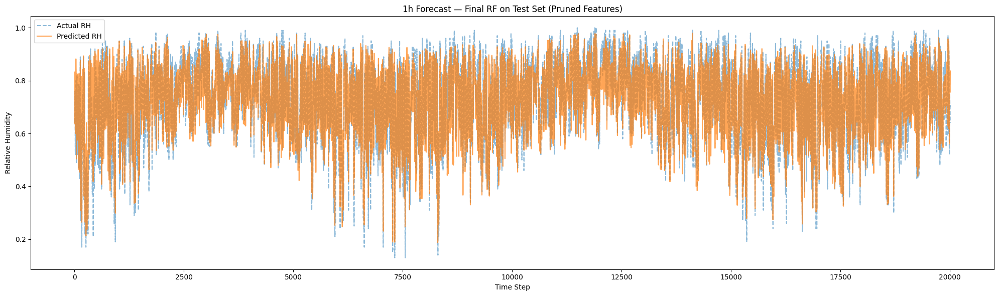

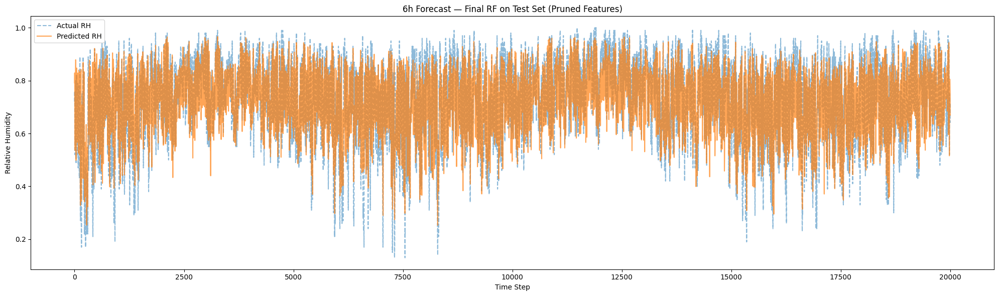

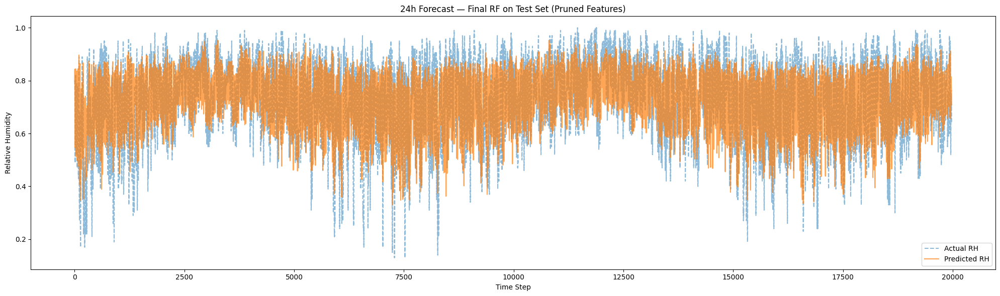

,Best_Params,MAE,MSE,R2
1h,"{'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 200}",0.05306,0.00462,0.81216
6h,"{'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}",0.07136,0.00865,0.64827
24h,"{'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 200}",0.08273,0.01161,0.52797


['random_forest_model.pkl']

In [32]:
import joblib

# Define final results dictionary
final_rf_results = {}

for label, config in forecast_configs.items():
    horizon = config["horizon"]
    lag_N = config["lag_N"]

    # Create lagged features using full training data (80%)
    trainval_lagged = create_lag_features_strict(df_trainval, lag_N, horizon, available_features)
    test_lagged = create_lag_features_strict(df_test, lag_N, horizon, available_features)

    # Rebuild allowed lag features
    allowed_features = [
        f"{col}_lag{lag}"
        for col in available_features
        for lag in range(horizon, horizon + lag_N)
    ]

    # Ensure pruned features align with what's available
    pruned_feats = [f for f in pruned_features[label] if f in allowed_features]

    # Prepare inputs
    X_trainval = trainval_lagged[pruned_feats]
    y_trainval = trainval_lagged[target]
    X_test = test_lagged[pruned_feats]
    y_test = test_lagged[target]

    # Train final model using previously tuned best params
    final_rf = RandomForestRegressor(**rf_results[label]["Best_Params"], random_state=42, n_jobs=-1)
    final_rf.fit(X_trainval, y_trainval)

    # Evaluate on test set
    preds = final_rf.predict(X_test)
    mae = mean_absolute_error(y_test, preds)
    mse = mean_squared_error(y_test, preds)
    r2 = r2_score(y_test, preds)

    # Store results
    final_rf_results[label] = {
        "MAE": mae,
        "MSE": mse,
        "R2": r2,
        "Best_Params": rf_results[label]["Best_Params"],
        "Model": final_rf
    }

    # Plot actual vs predicted
    plt.figure(figsize=(20, 6))
    plt.plot(y_test.reset_index(drop=True), label="Actual RH", linestyle='--', alpha=0.5)
    plt.plot(pd.Series(preds), label="Predicted RH", linestyle='-', alpha=0.7)
    plt.title(f"{label} Forecast — Final RF on Test Set (Pruned Features)")
    plt.xlabel("Time Step")
    plt.ylabel("Relative Humidity")
    plt.legend()
    plt.tight_layout()
    plt.show()

# Summary DataFrame
final_metrics_df = pd.DataFrame({
    label: {
        "Best_Params": m["Best_Params"],
        "MAE": round(m["MAE"], 5),
        "MSE": round(m["MSE"], 5),
        "R2": round(m["R2"], 5),
    } for label, m in final_rf_results.items()
}).T

pd.set_option("display.max_colwidth", None)
display(final_metrics_df)

# Save the trained model
joblib.dump(final_rf, "random_forest_model.pkl")


#### Analysis of Results (Optimised RF 2 — Pruned)

**Random Forest Performance Comparison — Before vs After Pruning (Test Set)**

| Forecast | MAE (Before) | MAE (After) | MSE (Before) | MSE (After) | R² (Before) | R² (After) | Change Summary             |
|----------|--------------|-------------|--------------|-------------|-------------|------------|----------------------------|
| **1h**   | 0.05541      | **0.05306** | 0.00519      | **0.00462** | 0.80331     | **0.81216** | Slight improvement         |
| **6h**   | **0.07021**  | 0.07136     | **0.00863**  | 0.00865     | **0.67279** | 0.64827     | Tiny drop in R²            |
| **24h**  | 0.08525      | **0.08273** | 0.01238      | **0.01161** | 0.53058     | 0.52797     | Trade-off: better MAE/MSE  |


**Key Insights**

- **1h Forecast**:
  - Pruned model **outperforms** the full model across all metrics (lower MAE & MSE, higher R²).
  - Indicates effective noise removal and stronger generalisation from fewer but more relevant features.

- **6h Forecast**:
  - Very **minor performance degradation** after pruning, with R² slightly decreasing.
  - Suggests that some mid-range predictors removed may have added marginal predictive power, though overall performance is stable.

- **24h Forecast**:
  - MAE and MSE **improved slightly**, while R² held steady.
  - Confirms pruning helped reduce model complexity without compromising long-term forecasting capability.

---

**Conclusion**

Feature pruning based on importance scores led to a **leaner and more efficient model**, especially beneficial for the 1h and 24h forecasts. Performance remained **robust or improved** even with a **reduction of over 60–80% in input features**, validating the pruning approach as an effective step in the Random Forest optimization pipeline.